In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 64.4 MB/s eta 0:00:00


In [ ]:
# Unzip images to a custom data folder
!unzip -q /content/data_ecg.zip -d /content/custom_data

In [ ]:
# Python function to automatically create data.yaml config file
# 1. Reads "classes.txt" file to get list of class names
# 2. Creates data dictionary with correct paths to folders, number of classes, and names of classes
# 3. Writes data in YAML format to data.yaml

import yaml
import os

def create_data_yaml(path_to_classes_txt, path_to_data_yaml):

  # Read class.txt to get class names
  if not os.path.exists(path_to_classes_txt):
    print(f'classes.txt file not found! Please create a classes.txt labelmap and move it to {path_to_classes_txt}')
    return
  with open(path_to_classes_txt, 'r') as f:
    classes = []
    for line in f.readlines():
      if len(line.strip()) == 0: continue
      classes.append(line.strip())
  number_of_classes = len(classes)

  # Create data dictionary
  data = {
      'path': '/content/data',
      'train': '/content/custom_data/data_ecg/train',
      'val': '/content/custom_data/data_ecg/val',
      'nc': number_of_classes,
      'names': classes
  }

  # Write data to YAML file
  with open(path_to_data_yaml, 'w') as f:
    yaml.dump(data, f, sort_keys=False)
  print(f'Created config file at {path_to_data_yaml}')

  return

# Define path to classes.txt and run function
path_to_classes_txt = '/content/custom_data/data_ecg/classes.txt'
path_to_data_yaml = '/content/data.yaml'

create_data_yaml(path_to_classes_txt, path_to_data_yaml)

print('\nFile contents:\n')
!cat /content/data.yaml

Created config file at /content/data.yaml

File contents:

path: /content/data
train: /content/custom_data/data_ecg/train
val: /content/custom_data/data_ecg/val
nc: 2
names:
- abnormal
- normal


In [28]:
!yolo detect train data=/content/data.yaml model=yolo11n.pt epochs=100 imgsz=960 batch=16 patience=100

Ultralytics 8.3.192 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretr

In [29]:
!yolo detect predict model=/content/runs/detect/train4/weights/last.pt source=/content/custom_data/data_ecg/val/images save=True conf=0.2 nms=True

Ultralytics 8.3.192 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/101 /content/custom_data/data_ecg/val/images/007aa4b0-abnormal33.png: 128x960 5 abnormals, 104.4ms
image 2/101 /content/custom_data/data_ecg/val/images/017a19aa-Ervita.jpg: 160x960 59 normals, 77.7ms
image 3/101 /content/custom_data/data_ecg/val/images/03cbbe72-Hanif_ECG.jpg: 192x960 43 normals, 78.4ms
image 4/101 /content/custom_data/data_ecg/val/images/067a6d6b-Normal32.png: 128x960 6 normals, 10.1ms
image 5/101 /content/custom_data/data_ecg/val/images/08b517f1-abnormal10.png: 128x960 5 abnormals, 3 normals, 9.0ms
image 6/101 /content/custom_data/data_ecg/val/images/1954bd89-Julizar.jpg: 160x960 52 normals, 10.0ms
image 7/101 /content/custom_data/data_ecg/val/images/1b9be2a5-Abnormal05.png: 128x960 6 abnormals, 6 normals, 9.7ms
image 8/101 /content/custom_data/data_ecg/val/images/1cc508eb-abnormal08

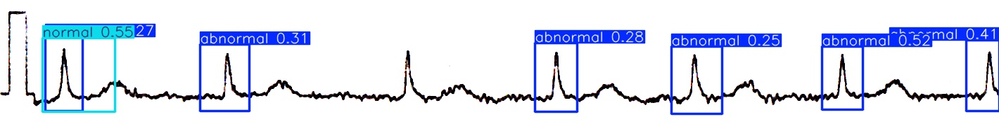

Image path: /content/runs/detect/predict6/3b3ae686-abnormal17.jpg




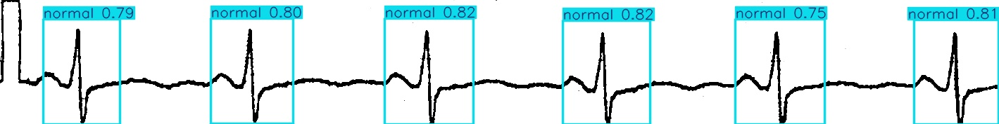

Image path: /content/runs/detect/predict6/c355230c-Normal17.jpg




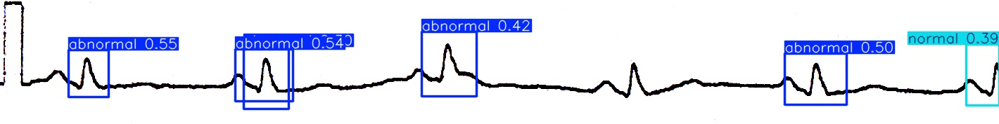

Image path: /content/runs/detect/predict6/84951acd-abnormal34.jpg




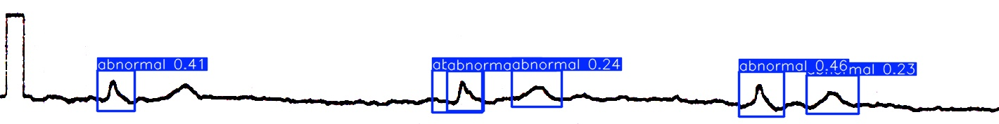

Image path: /content/runs/detect/predict6/cc433d6e-abnormal06.jpg




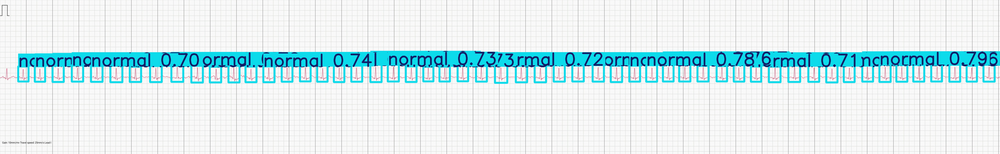

Image path: /content/runs/detect/predict6/583e7a8f-Sulus.jpg




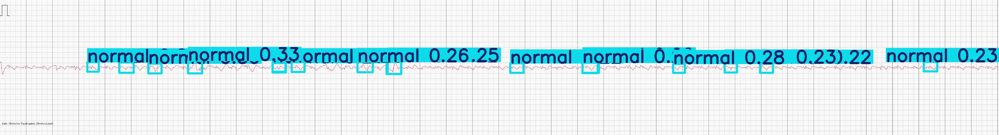

Image path: /content/runs/detect/predict6/70ce09fd-Raven.jpg




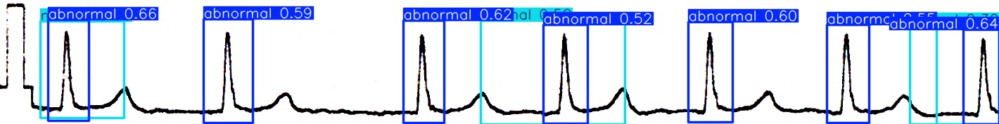

Image path: /content/runs/detect/predict6/378e4397-abnormal13.jpg




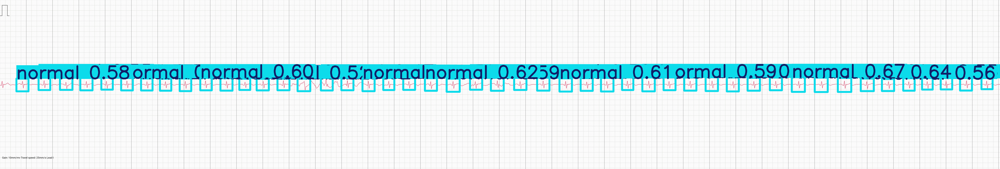

Image path: /content/runs/detect/predict6/42ff6404-Rino_s_HeartRate.jpg




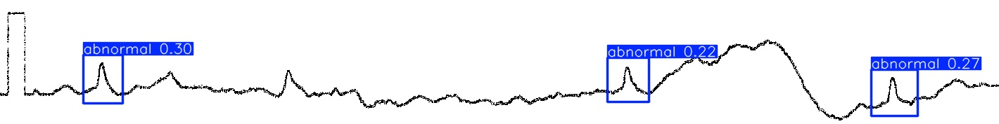

Image path: /content/runs/detect/predict6/9fd063f8-abnormal07.jpg




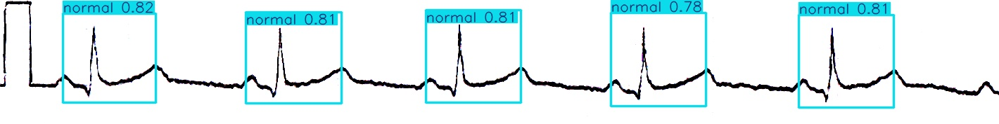

Image path: /content/runs/detect/predict6/8bad2eda-Normal1.jpg




In [30]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict6/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print(f'Image path: {image_path}')
  print('\n')


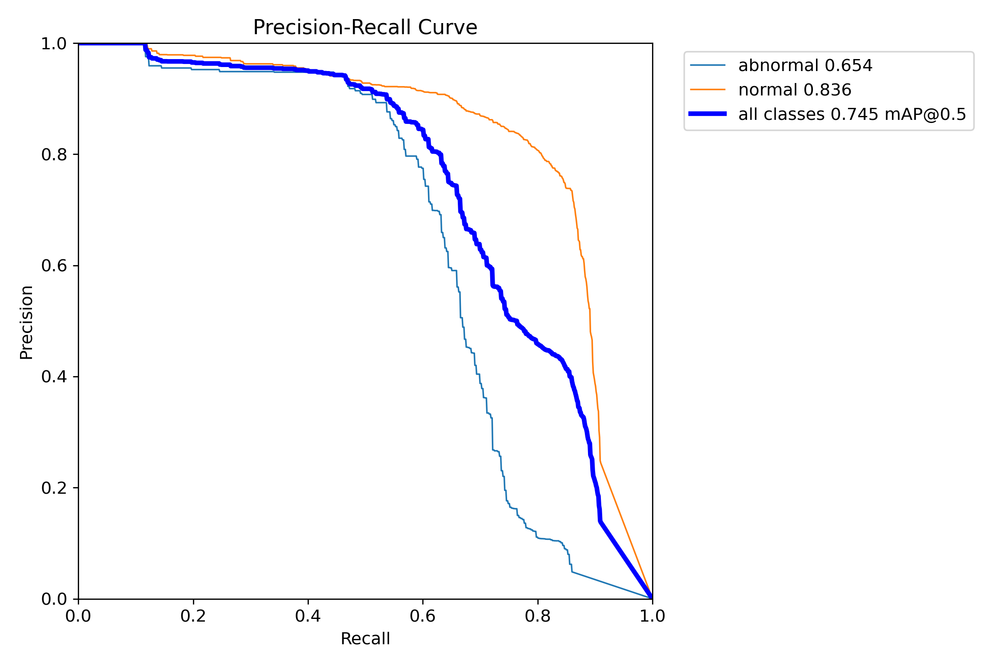

Image path: /content/runs/detect/train3/BoxPR_curve.png


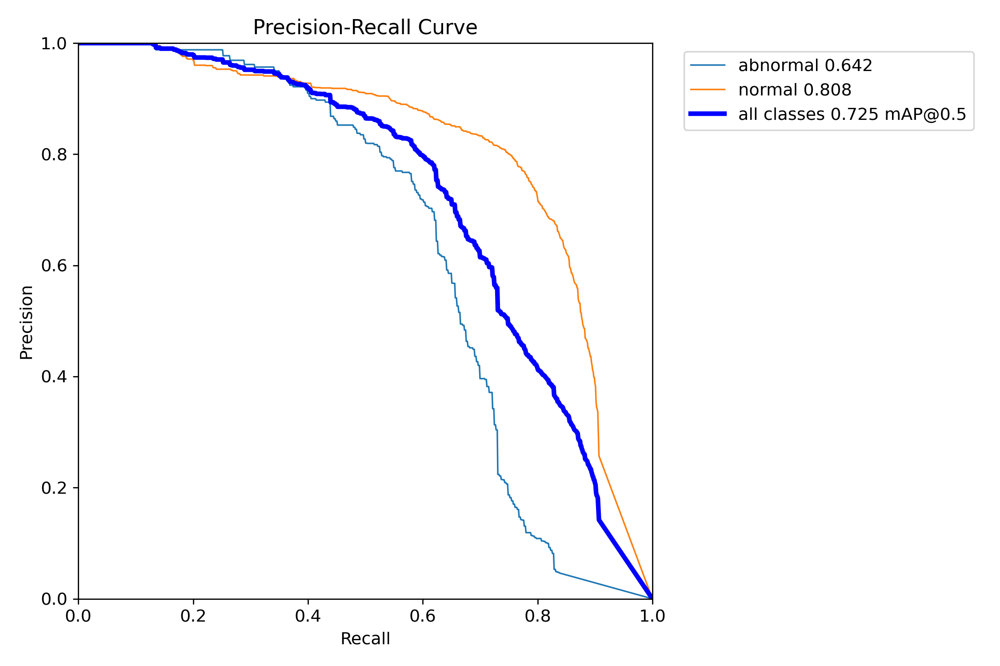

Image path: /content/runs/detect/train/BoxPR_curve.png




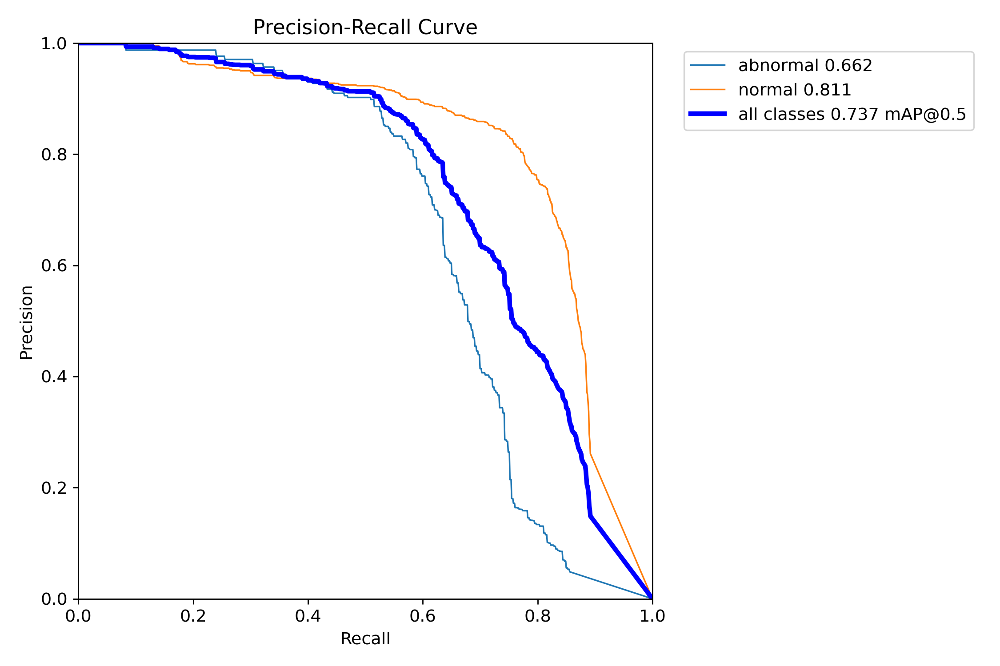

Image path: /content/runs/detect/train2/BoxPR_curve.png




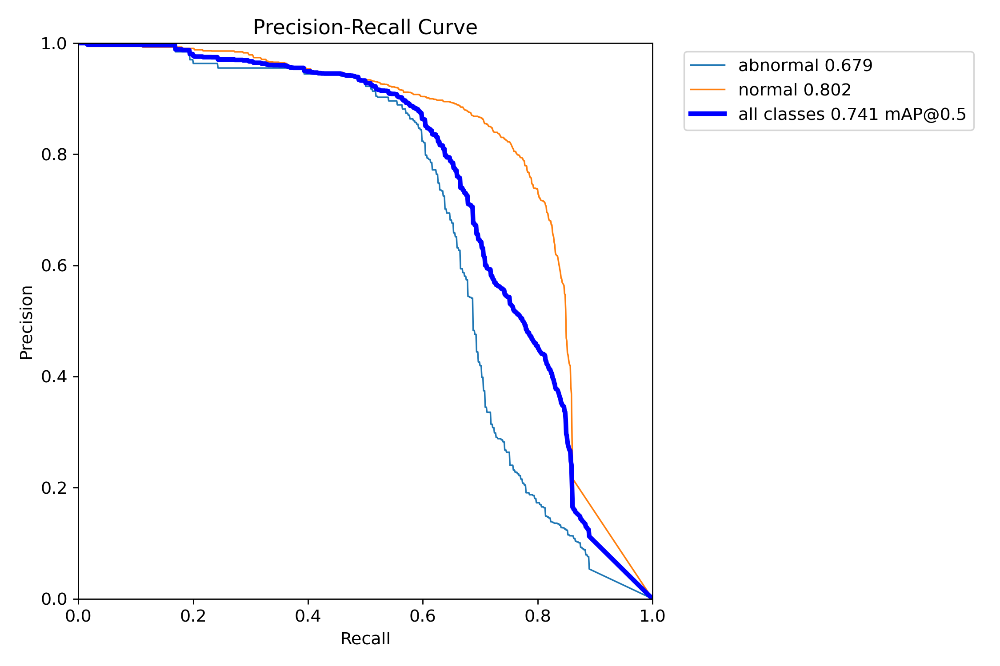

Image path: /content/runs/detect/train4/BoxPR_curve.png


In [31]:
import glob
from IPython.display import Image, display

box_pr_curve_s_path = glob.glob('/content/runs/detect/train3/BoxPR_curve.png')
box_pr_curve_l_path = glob.glob('/content/runs/detect/train/BoxPR_curve.png')
box_pr_curve_m_path = glob.glob('/content/runs/detect/train2/BoxPR_curve.png')
box_pr_curve_n_path = glob.glob('/content/runs/detect/train4/BoxPR_curve.png')
if box_pr_curve_s_path:
  display(Image(filename=box_pr_curve_s_path[0], height=400))
  print(f'Image path: {box_pr_curve_s_path[0]}')
else:
  print('BoxPR_curve.png not found.')

if box_pr_curve_l_path:
    display(Image(filename=box_pr_curve_l_path[0], height=400))
    print(f'Image path: {box_pr_curve_l_path[0]}')
    print('\n')
else:
    print('BoxPR_curve.png not found.')

if box_pr_curve_m_path:
        display(Image(filename=box_pr_curve_m_path[0], height=400))
        print(f'Image path: {box_pr_curve_m_path[0]}')
        print('\n')
else:
        print('BoxPR_curve.png not found.')

if box_pr_curve_n_path:
        display(Image(filename=box_pr_curve_n_path[0], height=400))
        print(f'Image path: {box_pr_curve_n_path[0]}')







In [58]:
from ultralytics import YOLO
import torch

def compute_iou(box1, box2):
    """
    Computes the Intersection over Union (IOU) of two bounding boxes.
    Boxes are expected in [x1, y1, x2, y2] format.
    """
    # Ensure boxes are in the correct format (e.g., convert from YOLO format if necessary)
    # Assuming box1 and box2 are [x1, y1, x2, y2]

    # Determine the coordinates of the intersection rectangle
    x_left = max(box1[0], box2[0])
    y_top = max(box1[1], box2[1])
    x_right = min(box1[2], box2[2])
    y_bottom = min(box1[3], box2[3])

    # Compute the area of intersection rectangle
    intersection_area = max(0, x_right - x_left) * max(0, y_bottom - y_top)

    # Compute the area of both the prediction and ground-truth rectangles
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Compute the intersection over union by dividing the intersection area by the sum of prediction and ground-truth areas - the intersection area
    iou = intersection_area / (box1_area + box2_area - intersection_area + 1e-6) # Add a small epsilon to avoid division by zero

    return iou

# Load the trained YOLOv11 model (assuming 'train4' is the run with the YOLOv11 model)
model = YOLO('/content/runs/detect/train4/weights/last.pt')

# Run inference on a sample image
# Replace with the path to an image you want to test
sample_image_path = '/content/custom_data/data_ecg/val/images/007aa4b0-abnormal33.png'
results = model(sample_image_path)

# Example of how to get predicted boxes and compute IOU if you had ground truth boxes
# Assuming you have ground truth boxes for the sample image in a list called ground_truth_boxes
# Each ground truth box should be in [x1, y1, x2, y2] format

# Placeholder for ground truth boxes (replace with actual ground truth)
# ground_truth_boxes = [[...]] # Example: [[50, 50, 100, 100], [150, 150, 200, 200]]


print(f"Processing image: {sample_image_path}")
for r in results:
    # Get predicted boxes in [x1, y1, x2, y2] format
    predicted_boxes = r.boxes.xyxy.tolist()
    print(f"Number of predicted boxes: {len(predicted_boxes)}")

    # If you have ground truth boxes, you can iterate through them and compute IOU
    # if 'ground_truth_boxes' in locals() and ground_truth_boxes:
    #     print(f"Number of ground truth boxes: {len(ground_truth_boxes)}")
    #     for i, gt_box in enumerate(ground_truth_boxes):
    #         for j, pred_box in enumerate(predicted_boxes):
    #             iou_score = compute_iou(gt_box, pred_box)
    #             print(f"IOU between Ground Truth Box {i+1} and Predicted Box {j+1}: {iou_score:.2f}")
    # elif predicted_boxes:
    #     print("No ground truth boxes provided to compute IOU against.")

    # If you just want to see the predicted box coordinates:
    if predicted_boxes:
        print("Predicted Boxes (xyxy format):")
        for i, box in enumerate(predicted_boxes):
            print(f"  Box {i+1}: {box}")
    else:
        print("No boxes predicted.")




image 1/1 /content/custom_data/data_ecg/val/images/007aa4b0-abnormal33.png: 128x960 4 abnormals, 8.7ms
Speed: 1.0ms preprocess, 8.7ms inference, 3.1ms postprocess per image at shape (1, 3, 128, 960)
Processing image: /content/custom_data/data_ecg/val/images/007aa4b0-abnormal33.png
Number of predicted boxes: 4
Predicted Boxes (xyxy format):
  Box 1: [158.64324951171875, 94.45835876464844, 208.2214813232422, 156.7018585205078]
  Box 2: [442.6680908203125, 103.22358703613281, 495.2008972167969, 165.95809936523438]
  Box 3: [1037.2239990234375, 111.10680389404297, 1085.1300048828125, 171.93577575683594]
  Box 4: [1321.1436767578125, 110.3984603881836, 1374.8922119140625, 176.27577209472656]


In [57]:
from ultralytics import YOLO

# Load the trained YOLOv11 model
model = YOLO('/content/runs/detect/train4/weights/last.pt')

# Run inference on a sample image
# Replace with the path to an image you want to test
sample_image_path = '/content/custom_data/data_ecg/val/images/007aa4b0-abnormal33.png'
results = model(sample_image_path)

print(f"Processing image: {sample_image_path}")
for r in results:
    if r.boxes is not None:
        print(f"Number of predicted boxes: {len(r.boxes)}")
        print("Predicted Boxes (xyxy format) and IOU:")
        for i, box in enumerate(r.boxes):
            # Get predicted box coordinates in [x1, y1, x2, y2] format
            box_coords = box.xyxy.tolist()[0]
            # Get the IOU score if available (YOLO results might not directly provide IOU in this format)
            # For now, we'll just print the box coordinates as IOU computation requires ground truth
            print(f"  Box {i+1}: {box_coords}")
            # If you had ground truth boxes, you would compute IOU here
            # For example:
            # if ground_truth_boxes:
            #     iou_score = compute_iou(ground_truth_boxes[i], box_coords) # Assuming a 1:1 mapping for simplicity
            #     print(f"  Box {i+1}: {box_coords}, IOU with ground truth: {iou_score:.2f}")
    else:
        print("No boxes predicted for this image.")


image 1/1 /content/custom_data/data_ecg/val/images/007aa4b0-abnormal33.png: 128x960 4 abnormals, 10.3ms
Speed: 1.2ms preprocess, 10.3ms inference, 3.4ms postprocess per image at shape (1, 3, 128, 960)
Processing image: /content/custom_data/data_ecg/val/images/007aa4b0-abnormal33.png
Number of predicted boxes: 4
Predicted Boxes (xyxy format) and IOU:
  Box 1: [158.64324951171875, 94.45835876464844, 208.2214813232422, 156.7018585205078]
  Box 2: [442.6680908203125, 103.22358703613281, 495.2008972167969, 165.95809936523438]
  Box 3: [1037.2239990234375, 111.10680389404297, 1085.1300048828125, 171.93577575683594]
  Box 4: [1321.1436767578125, 110.3984603881836, 1374.8922119140625, 176.27577209472656]


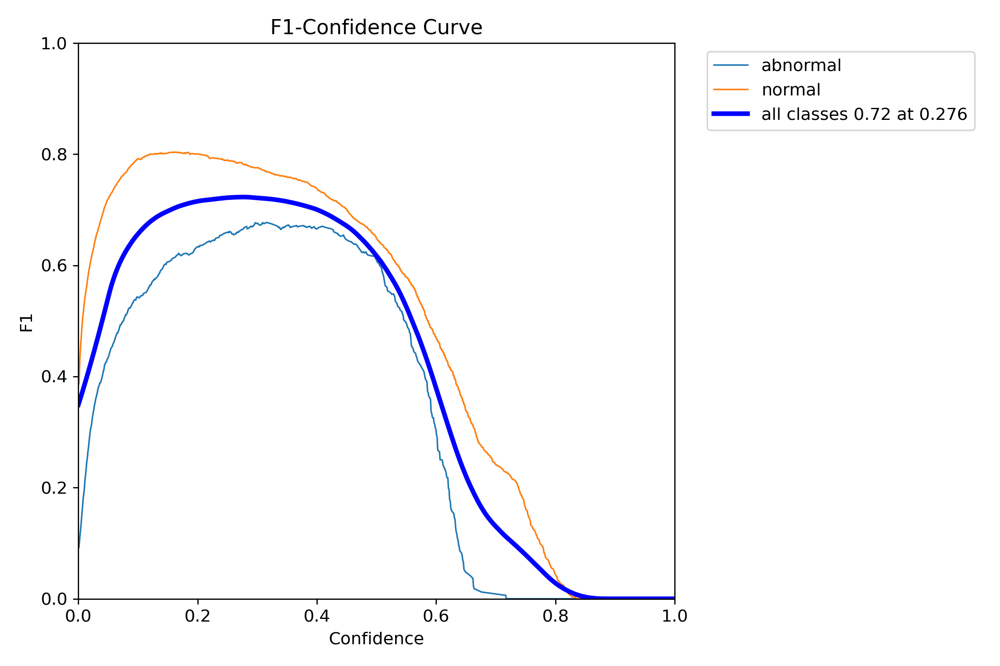

Image path: /content/runs/detect/train3/BoxF1_curve.png




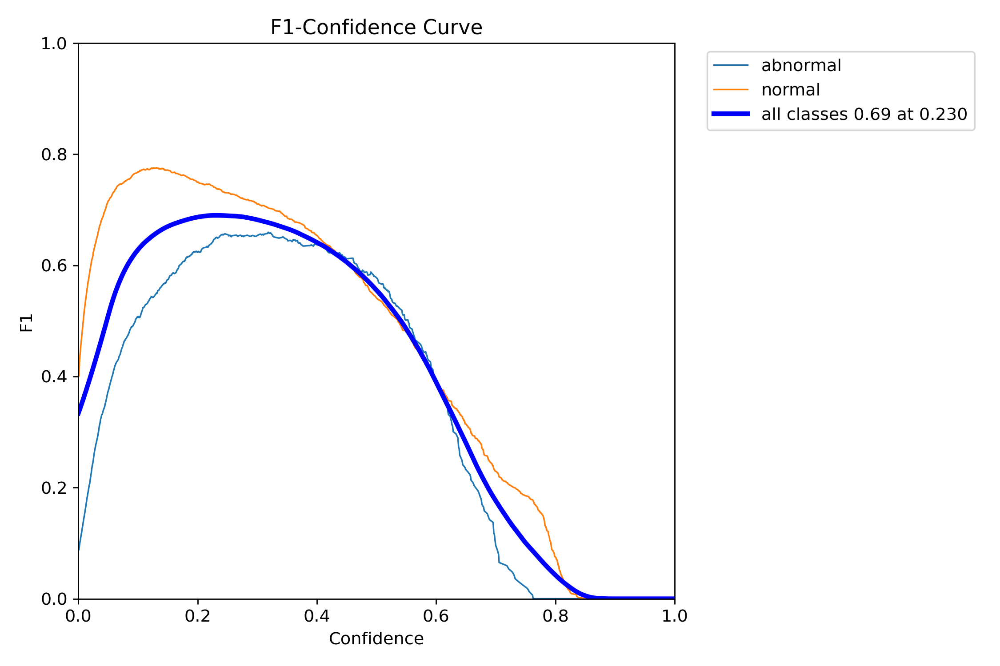

Image path: /content/runs/detect/train/BoxF1_curve.png




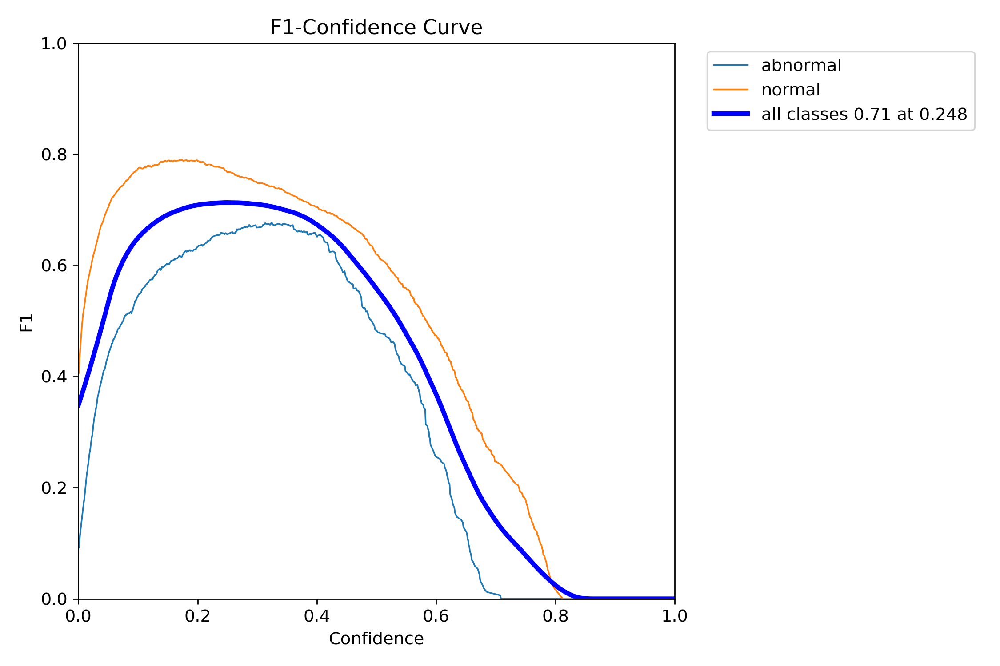

Image path: /content/runs/detect/train2/BoxF1_curve.png




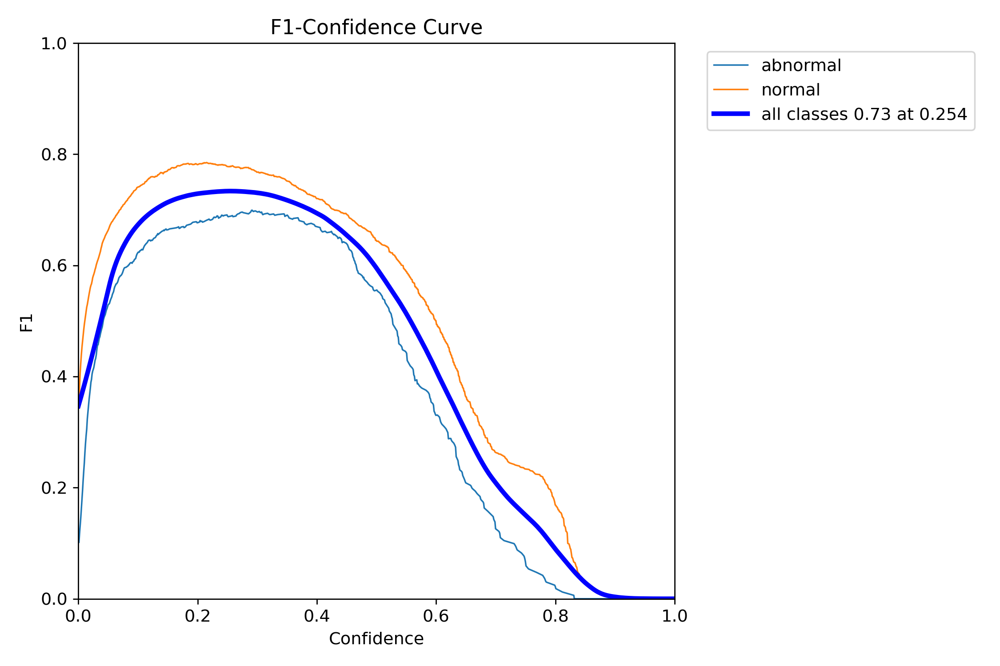

Image path: /content/runs/detect/train4/BoxF1_curve.png




In [55]:
import glob
from IPython.display import Image, display

box_f1_curve_paths = glob.glob('/content/runs/detect/train3/BoxF1_curve.png')
box_f2_curve_paths = glob.glob('/content/runs/detect/train/BoxF1_curve.png')
box_f3_curve_paths = glob.glob('/content/runs/detect/train2/BoxF1_curve.png')
box_f4_curve_paths = glob.glob('/content/runs/detect/train4/BoxF1_curve.png')

if box_f1_curve_paths:
    for box_f1_curve_path in box_f1_curve_paths:
        display(Image(filename=box_f1_curve_path, height=400))
        print(f'Image path: {box_f1_curve_path}')
        print('\n')
else:
    print('BoxF1_curve.png not found in any run directory.')

if box_f2_curve_paths:
    for box_f2_curve_path in box_f2_curve_paths:
        display(Image(filename=box_f2_curve_path, height=400))
        print(f'Image path: {box_f2_curve_path}')
        print('\n')
else:
    print('BoxF1_curve.png not found in any run directory.')

if box_f3_curve_paths:
    for box_f3_curve_path in box_f3_curve_paths:
        display(Image(filename=box_f3_curve_path, height=400))
        print(f'Image path: {box_f3_curve_path}')
        print('\n')
else:
    print('BoxF1_curve.png not found in any run directory.')

if box_f4_curve_paths:
    for box_f4_curve_path in box_f4_curve_paths:
        display(Image(filename=box_f4_curve_path, height=400))
        print(f'Image path: {box_f4_curve_path}')
        print('\n')
else:
    print('BoxF1_curve.png not found in any run directory.')

In [60]:
from ultralytics import YOLO

# Load the trained model
model = YOLO('/content/runs/detect/train4/weights/last.pt')

# Run inference on a sample image
results = model('/content/Rhythm-Strip-LITFL-Atrial-Fibrillation (2).jpg')

# analyze predictions
is_healthy = True
abnormal_findings = []

for r in results:
    for box in r.boxes:
        cls = int(box.cls[0])
        conf = float(box.conf[0])
        label = model.names[cls]

        if label != "normal" and conf > 0.5:  # abnormal condition
            is_healthy = False
            abnormal_findings.append((label, conf))

# Decision
abnormal_findings = []

for r in results:
    for box in r.boxes:
        cls = int(box.cls[0])
        conf = float(box.conf[0])
        label = model.names[cls]

        if label == "abnormal" and conf > 0.5:  # hanya abnormal yang dihitung
            abnormal_findings.append((label, conf))

jumlah_abnormal = len(abnormal_findings)

# Decision logic
if jumlah_abnormal == 0:
    print("✅ Detak jantung sehat (Normal)")
else:
    if jumlah_abnormal > 5:
        print("⚠️ Detak jantung abnormal, perlu istirahat")
    else:
        print("⚠️ Detak jantung abnormal ringan, kurangi merokok dan lebihkan olahraga")

    # tampilkan detail abnormal
    for label, conf in abnormal_findings:
        print(f"   - {label} (conf={conf:.2f})")

print(f"\nJumlah abnormal terdeteksi: {jumlah_abnormal}")


image 1/1 /content/Rhythm-Strip-LITFL-Atrial-Fibrillation (2).jpg: 256x960 17 abnormals, 10.7ms
Speed: 1.9ms preprocess, 10.7ms inference, 8.6ms postprocess per image at shape (1, 3, 256, 960)
⚠️ Detak jantung abnormal, perlu istirahat
   - abnormal (conf=0.78)
   - abnormal (conf=0.75)
   - abnormal (conf=0.72)
   - abnormal (conf=0.72)
   - abnormal (conf=0.70)
   - abnormal (conf=0.67)
   - abnormal (conf=0.64)
   - abnormal (conf=0.63)
   - abnormal (conf=0.56)
   - abnormal (conf=0.52)
   - abnormal (conf=0.50)

Jumlah abnormal terdeteksi: 11
